In [1]:
# FIFA 21 Mini - project
# Our manager (a kid that plays fifa) has his best CAM (centre advanced midfielder) injured and he asked us to get
# him the best possible player with some conditions

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn as sns
import os 
import math 
from sklearn.preprocessing import OneHotEncoder

from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

In [3]:
fifa21 = pd.read_csv("fifa21_male2.csv")
fifa21.head()

,ID,Name,Age,OVA,Nationality,Club,BOV,BP,Position,Player Photo,Club Logo,Flag Photo,POT,Team & Contract,Height,Weight,foot,Growth,Joined,Loan Date End,Value,Wage,Release Clause,Contract,Attacking,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,Curve,FK Accuracy,Long Passing,Ball Control,Movement,Acceleration,Sprint Speed,Agility,Reactions,Balance,Power,Shot Power,Jumping,Stamina,Strength,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Marking,Standing Tackle,Sliding Tackle,Goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total Stats,Base Stats,W/F,SM,A/W,D/W,IR,PAC,SHO,PAS,DRI,DEF,PHY,Hits,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,GK,Gender
0,2,G. Pasquale,33,69,Italy,Udinese,71,LWB,LM,https://cdn.sofifa.com/players/000/002/16_120.png,https://cdn.sofifa.com/teams/55/light_60.png,https://cdn.sofifa.com/flags/it.png,69,Udinese 2008 ~ 2016,"6'0""",181lbs,Left,0,"Jul 1, 2008",NaN,€625K,€7K,€0,2008 ~ 2016,313,75,50,59,71,58.0,338,73,65.0,60,69,71,347,68,74,68.0,69,68.0,347,74,68.0,69,68,68,320,72,69.0,63.0,66.0,50,NaN,208,70,69,69.0,56,14,5,15,10,12,1929,408,3 ★,2★,Medium,High,2 ★,71,59,70,71,68,69,4,65+0,65+0,65+0,68+0,67+0,67+0,67+0,68+0,68+0,68+0,68+0,69+0,69+0,69+0,69+0,69+0,71+-2,70+-1,70+-1,70+-1,71+-2,70+-1,69+0,69+0,69+0,70+-1,17+0,Male
1,16,Luis García,37,71,Spain,KAS Eupen,70,CM,CM CAM CDM,https://cdn.sofifa.com/players/000/016/19_120.png,https://cdn.sofifa.com/teams/2013/light_60.png,https://cdn.sofifa.com/flags/es.png,71,KAS Eupen 2014 ~ 2019,"5'10""",143lbs,Right,0,"Jul 19, 2014",NaN,€600K,€7K,€1.1M,2014 ~ 2019,337,68,64,61,76,68.0,369,69,79.0,79,71,71,305,56,50,62.0,65,72.0,324,75,54.0,64,60,71,362,71,71.0,72.0,73.0,75,79.0,153,70,43,40.0,56,9,12,13,11,11,1906,385,4 ★,3★,Medium,Medium,1 ★,53,69,73,69,58,63,4,67+1,67+1,67+1,67+0,68+0,68+0,68+0,67+0,70+1,70+1,70+1,68+1,70+1,70+1,70+1,68+1,62+1,66+1,66+1,66+1,62+1,60+1,60+1,60+1,60+1,60+1,17+1,Male
2,27,J. Cole,33,71,England,Coventry City,71,CAM,CAM RM RW LM,https://cdn.sofifa.com/players/000/027/16_120.png,https://cdn.sofifa.com/teams/1800/light_60.png,https://cdn.sofifa.com/flags/gb-eng.png,71,Coventry City 2016 ~ 2020,"5'9""",161lbs,Right,0,"Jan 7, 2016",NaN,€1.1M,€15K,€0,2016 ~ 2020,337,80,64,41,77,75.0,387,79,84.0,77,69,78,295,48,42,71.0,59,75.0,284,72,58.0,29,56,69,317,69,39.0,69.0,74.0,66,NaN,99,35,34,30.0,51,9,6,13,16,7,1770,354,4 ★,4★,Medium,Low,2 ★,45,68,76,77,36,52,11,64+0,64+0,64+0,70+0,69+0,69+0,69+0,70+0,71+0,71+0,71+0,68+0,66+0,66+0,66+0,68+0,52+0,54+0,54+0,54+0,52+0,47+0,46+0,46+0,46+0,47+0,15+0,Male
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,Sunderland,70,ST,NaN,https://cdn.sofifa.com/players/000/036/09_120.png,https://cdn.sofifa.com/teams/106/light_60.png,https://cdn.sofifa.com/flags/tt.png,82,Sunderland 2009,"5'11""",165lbs,Right,14,NaN,NaN,€0,€0,€0,2009,264,54,70,60,80,NaN,255,68,NaN,46,64,77,176,59,62,NaN,55,NaN,239,63,NaN,51,66,59,271,59,70.0,72.0,NaN,70,NaN,75,34,41,NaN,68,5,21,64,21,21,1348,369,3 ★,1★,NaN,NaN,1 ★,61,66,66,69,47,60,3,67+0,67+0,67+0,66+0,67+0,67+0,67+0,66+0,70+0,70+0,70+0,66+0,68+0,68+0,68+0,66+0,56+0,65+0,65+0,65+0,56+0,57+0,51+0,51+0,51+0,57+0,22+0,Male
4,41,Iniesta,36,81,Spain,Vissel Kobe,82,CAM,CM CAM,https://cdn.sofifa.com/players/000/041/20_120.png,https://cdn.sofifa.com/teams/101146/light_60.png,https://cdn.sofifa.com/flags/es.png,81,Vissel Kobe 2018 ~ 2021,"5'7""",150lbs,Right,0,"Jul 16, 2018",NaN,€5.5M,€12K,€7.2M,2018 ~ 2021,367,75,69,54,90,79.0,408,85,80.0,70,83,90,346,61,56,79.0,75,75.0,297,67,40.0,58,62,70,370,58,70.0,78.0,93.0,71,89.0,181,68,57,56.0,45,6,13,6,13,7,2014,420,4 ★,4★,High,Medium,4 ★,58,70,85,85,63,59,149,72+3,72+3,72+3,79+0,79+0,79+0,79+0,79+0,82+-1,82+-1,82+-1,79+2,81+0,81+0,81+0,79+2,70+3,73+3,73+3,73+3,70+3,67+3,64+3,64+3,64+3,67+3,17+3,Male


In [4]:
fifa21.shape

(17125, 107)

In [5]:
fifa21.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17125 entries, 0 to 17124
Columns: 107 entries, ID to Gender
dtypes: float64(10), int64(45), object(52)
memory usage: 14.0+ MB


In [6]:
fifa21["Gender"].unique()

array(['Male'], dtype=object)

In [7]:
fifa21.columns

Index(['ID', 'Name', 'Age', 'OVA', 'Nationality', 'Club', 'BOV', 'BP',
       'Position', 'Player Photo',
       ...
       'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB', 'GK', 'Gender'],
      dtype='object', length=107)

In [8]:
fifa21["BP"].value_counts()

CB     3252
ST     2660
CAM    2246
GK     1576
RM     1404
CDM    1246
CM      990
LB      921
RB      894
LM      805
RW      329
LWB     252
RWB     252
LW      209
CF       89
Name: BP, dtype: int64

In [9]:
fifa21.describe()

,ID,Age,OVA,BOV,POT,Growth,Attacking,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,Curve,FK Accuracy,Long Passing,Ball Control,Movement,Acceleration,Sprint Speed,Agility,Reactions,Balance,Power,Shot Power,Jumping,Stamina,Strength,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Marking,Standing Tackle,Sliding Tackle,Goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total Stats,Base Stats,PAC,SHO,PAS,DRI,DEF,PHY
count,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17067.000000,17125.000000,17125.000000,17067.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17067.000000,17125.000000,17067.000000,17125.000000,17125.000000,17067.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17118.000000,17118.000000,17067.000000,17125.000000,16702.000000,17125.000000,17125.000000,17125.000000,17067.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000
mean,219388.716204,25.272934,66.965022,67.900204,72.489810,5.524788,258.537752,51.621314,47.956672,53.598832,60.507620,45.005742,266.607591,57.846423,49.574676,44.387270,54.324321,60.642803,322.693664,65.445898,65.443036,64.602273,62.924847,64.715591,302.414774,59.711416,65.170212,63.309606,65.308555,49.135708,261.922803,56.997839,47.085582,52.372766,55.443605,50.251445,59.940965,141.469898,47.246949,48.279358,46.099725,77.609693,15.600467,15.484672,15.472058,15.514277,15.738628,1631.256175,361.372146,68.091620,54.967299,58.926540,64.209869,50.266102,64.910715
std,37499.197507,4.942665,6.864329,6.637538,5.769949,5.787539,72.255687,17.875715,19.391547,16.947164,13.960635,17.729483,76.809344,18.047250,18.188344,17.504128,14.856911,15.873647,54.933593,14.657889,14.437377,14.372443,9.037279,14.031563,49.380576,13.417931,11.918063,15.313272,12.627212,19.044862,62.913935,17.021619,20.846705,19.094432,13.730080,15.696363,11.751111,61.595180,20.182548,21.483597,21.185154,81.136603,16.828637,16.143679,15.997328,16.406064,17.130908,260.357024,40.252290,11.147116,13.877605,10.186728,9.832734,16.853801,9.660260
min,2.000000,16.000000,38.000000,42.000000,47.000000,-1.000000,33.000000,6.000000,3.000000,5.000000,7.000000,4.000000,43.000000,5.000000,4.000000,5.000000,9.000000,5.000000,113.000000,12.000000,11.000000,14.000000,24.000000,17.000000,128.000000,12.000000,22.000000,11.000000,16.000000,4.000000,50.000000,9.000000,4.000000,2.000000,10.000000,7.000000,12.000000,17.000000,3.000000,5.000000,6.000000,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,731.000000,228.000000,25.000000,16.000000,25.000000,28.000000,12.000000,27.000000
25%,204082.000000,21.000000,62.000000,64.000000,69.000000,0.000000,232.000000,41.000000,33.000000,46.000000,56.000000,32.000000,232.000000,53.000000,37.000000,32.000000,45.000000,57.000000,294.000000,58.000000,59.000000,57.000000,57.000000,57.000000,272.000000,50.000000,58.000000,56.000000,58.000000,35.000000,235.000000,45.000000,26.000000,43.000000,47.000000,40.000000,53.000000,84.000000,29.000000,28.000000,25.000000,48.000000,8.000000,8.000000,8.000000,8.000000,8.000000,1492.000000,333.000000,62.000000,46.000000,52.000000,59.000000,35.000000,59.000000
50%,228961.000000,25.000000,67.000000,68.000000,72.000000,4.000000,271.000000,56.000000,52.000000,57.000000,63.000000,46.000000,279.000000,63.000000,51.000000,43.000000,57.000000,64.000000,331.000000,68.000000,68.000000,67.000000,63.000000,67.000000,308.000000,61.000000,66.000000,66.000000,67.000000,53.000000,269.000000,60.000000,53.000000,57.000000,57.000000,51.000000,61.000000,158.000000,52.000000,55.000000,52.000000,53.000000,11.000000,11.000000,11.000000,11.000000,11.000000,1659.000000,362.000000,69.000000,58.000000,60.000000,65.000000,53.000000,66

In [10]:
fifa21.columns

Index(['ID', 'Name', 'Age', 'OVA', 'Nationality', 'Club', 'BOV', 'BP',
       'Position', 'Player Photo',
       ...
       'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB', 'GK', 'Gender'],
      dtype='object', length=107)

In [11]:
# so we are going to drop columns that we think that aren't going to be useful in the end
fifa21 = fifa21.drop(["Player Photo","Flag Photo","Height", "Weight", "foot", "Club Logo", "Wage", "Crossing", "Finishing", 
                      "Heading Accuracy", "Short Passing", "Volleys", "Dribbling", "Curve", "FK Accuracy", 
                      "Marking", "Standing Tackle", "Sliding Tackle", 
                      "GK Diving", "GK Handling", "GK Kicking", "GK Positioning", "GK Reflexes",
                      "Long Passing", "Ball Control", "Acceleration", "Sprint Speed", "Agility", "Reactions", 
                      "Balance", "Shot Power", "Jumping", "Stamina", "Strength", "Long Shots",
                      "Aggression", "Interceptions", "Positioning", "Vision" , "Penalties", "Composure"
                      ,"Joined", "Loan Date End","LS","ST", "RS", "LW", "LF", "CF", "RF", "RW",
                      "LAM", "CAM", "RAM", "LM", "LCM", "CM", "RCM", "RM", "LWB", "LDM","CDM", 
                      "RDM", 'RWB', 'LB', 'LCB', 'CB', 'RCB', 
                      'RB', 'GK',"W/F","Hits", "SM", "A/W", "D/W", "IR", "Gender"], axis = 1)
fifa21.head()

,ID,Name,Age,OVA,Nationality,Club,BOV,BP,Position,POT,Team & Contract,Growth,Value,Release Clause,Contract,Attacking,Skill,Movement,Power,Mentality,Defending,Goalkeeping,Total Stats,Base Stats,PAC,SHO,PAS,DRI,DEF,PHY
0,2,G. Pasquale,33,69,Italy,Udinese,71,LWB,LM,69,Udinese 2008 ~ 2016,0,€625K,€0,2008 ~ 2016,313,338,347,347,320,208,56,1929,408,71,59,70,71,68,69
1,16,Luis García,37,71,Spain,KAS Eupen,70,CM,CM CAM CDM,71,KAS Eupen 2014 ~ 2019,0,€600K,€1.1M,2014 ~ 2019,337,369,305,324,362,153,56,1906,385,53,69,73,69,58,63
2,27,J. Cole,33,71,England,Coventry City,71,CAM,CAM RM RW LM,71,Coventry City 2016 ~ 2020,0,€1.1M,€0,2016 ~ 2020,337,387,295,284,317,99,51,1770,354,45,68,76,77,36,52
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,Sunderland,70,ST,NaN,82,Sunderland 2009,14,€0,€0,2009,264,255,176,239,271,75,68,1348,369,61,66,66,69,47,60
4,41,Iniesta,36,81,Spain,Vissel Kobe,82,CAM,CM CAM,81,Vissel Kobe 2018 ~ 2021,0,€5.5M,€7.2M,2018 ~ 2021,367,408,346,297,370,181,45,2014,420,58,70,85,85,63,59


In [12]:
fifa21.columns

Index(['ID', 'Name', 'Age', 'OVA', 'Nationality', 'Club', 'BOV', 'BP',
       'Position', 'POT', 'Team & Contract', 'Growth', 'Value',
       'Release Clause', 'Contract', 'Attacking', 'Skill', 'Movement', 'Power',
       'Mentality', 'Defending', 'Goalkeeping', 'Total Stats', 'Base Stats',
       'PAC', 'SHO', 'PAS', 'DRI', 'DEF', 'PHY'],
      dtype='object')

In [13]:
# shooting (SHO), pace (PAC), passing (PAS), dribble (DRI), defending (DEF), physical (PHY)” 

In [14]:
cols = [col_name.lower().replace(" ", "_") for col_name in fifa21.columns]
fifa21.columns = cols
fifa21.columns

Index(['id', 'name', 'age', 'ova', 'nationality', 'club', 'bov', 'bp',
       'position', 'pot', 'team_&_contract', 'growth', 'value',
       'release_clause', 'contract', 'attacking', 'skill', 'movement', 'power',
       'mentality', 'defending', 'goalkeeping', 'total_stats', 'base_stats',
       'pac', 'sho', 'pas', 'dri', 'def', 'phy'],
      dtype='object')

In [15]:
fifa21.head()

,id,name,age,ova,nationality,club,bov,bp,position,pot,team_&_contract,growth,value,release_clause,contract,attacking,skill,movement,power,mentality,defending,goalkeeping,total_stats,base_stats,pac,sho,pas,dri,def,phy
0,2,G. Pasquale,33,69,Italy,Udinese,71,LWB,LM,69,Udinese 2008 ~ 2016,0,€625K,€0,2008 ~ 2016,313,338,347,347,320,208,56,1929,408,71,59,70,71,68,69
1,16,Luis García,37,71,Spain,KAS Eupen,70,CM,CM CAM CDM,71,KAS Eupen 2014 ~ 2019,0,€600K,€1.1M,2014 ~ 2019,337,369,305,324,362,153,56,1906,385,53,69,73,69,58,63
2,27,J. Cole,33,71,England,Coventry City,71,CAM,CAM RM RW LM,71,Coventry City 2016 ~ 2020,0,€1.1M,€0,2016 ~ 2020,337,387,295,284,317,99,51,1770,354,45,68,76,77,36,52
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,Sunderland,70,ST,NaN,82,Sunderland 2009,14,€0,€0,2009,264,255,176,239,271,75,68,1348,369,61,66,66,69,47,60
4,41,Iniesta,36,81,Spain,Vissel Kobe,82,CAM,CM CAM,81,Vissel Kobe 2018 ~ 2021,0,€5.5M,€7.2M,2018 ~ 2021,367,408,346,297,370,181,45,2014,420,58,70,85,85,63,59


In [16]:
# From this point, some exploration

In [17]:
fifa21.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17125 entries, 0 to 17124
Data columns (total 30 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   id               17125 non-null  int64 
 1   name             17125 non-null  object
 2   age              17125 non-null  int64 
 3   ova              17125 non-null  int64 
 4   nationality      17125 non-null  object
 5   club             17102 non-null  object
 6   bov              17125 non-null  int64 
 7   bp               17125 non-null  object
 8   position         16712 non-null  object
 9   pot              17125 non-null  int64 
 10  team_&_contract  17125 non-null  object
 11  growth           17125 non-null  int64 
 12  value            17125 non-null  object
 13  release_clause   17125 non-null  object
 14  contract         17125 non-null  object
 15  attacking        17125 non-null  int64 
 16  skill            17125 non-null  int64 
 17  movement         17125 non-null

In [18]:
fifa21["id"].nunique()
# = total entries

17125

In [19]:
fifa21["name"].nunique()

16176

In [20]:
fifa21.name.duplicated().value_counts()
# there are some names that are duplicated but 2 individuals can have the same name

False    16176
True       949
Name: name, dtype: int64

In [21]:
# 949 duplicates

In [22]:
double = fifa21["name"][fifa21.name.duplicated() == True]

In [23]:
fifa21.columns


Index(['id', 'name', 'age', 'ova', 'nationality', 'club', 'bov', 'bp',
       'position', 'pot', 'team_&_contract', 'growth', 'value',
       'release_clause', 'contract', 'attacking', 'skill', 'movement', 'power',
       'mentality', 'defending', 'goalkeeping', 'total_stats', 'base_stats',
       'pac', 'sho', 'pas', 'dri', 'def', 'phy'],
      dtype='object')

In [24]:
fifa21["age"].value_counts()

22    1322
23    1307
21    1267
20    1255
24    1227
25    1109
26    1087
28    1033
27    1026
19    1012
29     872
30     769
31     669
18     662
32     575
33     505
34     394
17     288
35     262
36     174
37     111
38      73
16      45
39      39
40      21
42       9
41       8
43       2
47       1
53       1
Name: age, dtype: int64

In [25]:
fifa21["ova"].value_counts()

67    1018
65    1010
64    1009
66     975
68     943
69     926
70     914
63     864
72     820
71     792
62     757
73     645
61     636
75     626
60     581
74     549
59     473
58     398
76     376
77     333
57     322
78     255
56     251
55     227
79     205
80     158
54     151
53     146
52     115
81     108
51      91
83      81
82      75
50      68
84      43
49      40
85      39
48      23
87      23
86      18
88      11
47       9
90       6
89       6
91       4
42       1
38       1
93       1
92       1
45       1
Name: ova, dtype: int64

In [26]:
fifa21["nationality"].value_counts()

England      1707
Germany      1154
Spain        1121
France        990
Brazil        857
             ... 
Tanzania        1
Singapore       1
Eritrea         1
Malta           1
Barbados        1
Name: nationality, Length: 167, dtype: int64

In [27]:
fifa21["club"].value_counts()

Chelsea                         45
Manchester United               45
Bolton Wanderers                45
Wolverhampton Wanderers         43
AS Monaco                       43
                                ..
Vitória                          1
CA Bastia                        1
Inverness Caledonian Thistle     1
Denmark                          1
Galway United                    1
Name: club, Length: 917, dtype: int64

In [28]:
fifa21["bp"].value_counts()

CB     3252
ST     2660
CAM    2246
GK     1576
RM     1404
CDM    1246
CM      990
LB      921
RB      894
LM      805
RW      329
LWB     252
RWB     252
LW      209
CF       89
Name: bp, dtype: int64

In [29]:
fifa21["value"].value_counts()

€1.1M     500
€0        457
€1M       347
€325K     342
€450K     341
         ... 
€52M        1
€72.5M      1
€67.5M      1
€46M        1
€5K         1
Name: value, Length: 216, dtype: int64

In [30]:
fifa21['value'] = fifa21['value'].replace({'€': '', ' ': '', 'M': 'e+06', 'K': 'e+03'}, regex=True).astype(float).astype(int)
fifa21["value"].value_counts()

1100000     500
0           457
1000000     347
325000      342
450000      341
           ... 
52000000      1
72500000      1
67500000      1
46000000      1
5000          1
Name: value, Length: 216, dtype: int64

In [31]:
fifa21["bov"].value_counts()

67    1062
66    1031
68    1025
65    1023
69     998
70     971
64     939
71     896
72     883
63     755
73     743
62     655
74     648
75     617
61     604
60     479
76     458
77     418
59     373
78     317
58     282
57     254
79     198
80     190
56     187
55     168
81     149
54     119
82     108
53     105
52      88
83      80
84      51
51      49
85      47
50      32
86      30
87      26
49      19
88      12
48      10
89       9
90       5
91       5
47       2
42       1
93       1
44       1
92       1
46       1
Name: bov, dtype: int64

In [32]:
fifa21["position"].value_counts()

CB            2047
ST            1818
GK            1517
CDM CM         748
LB             654
              ... 
CDM LB CM        1
LW ST CAM        1
IVST RM CF       1
ST LW RM         1
LB LM CDM        1
Name: position, Length: 622, dtype: int64

In [33]:
fifa21["release_clause"] = fifa21["release_clause"].replace({'€': '', ' ': '', 'M': 'e+06', 'K': 'e+03'}, regex=True).astype(float).astype(int)
fifa21["release_clause"].value_counts()

0           1785
1100000      525
1200000      441
1300000      421
1400000      389
            ... 
87000000       1
49500000       1
70900000       1
49800000       1
367000         1
Name: release_clause, Length: 1200, dtype: int64

In [34]:
fifa21["team_&_contract"].value_counts()

India Free                      36
Bulgaria Free                   27
Egypt Free                      23
Uruguay Free                    22
Ecuador Free                    21
                                ..
Milan 2018 ~ 2023                1
Al Hilal 2012 ~ 2021             1
Al Hilal 2011 ~ 2022             1
Lokomotiv Moscow 2011 ~ 2021     1
Burnley 2020 ~ 2021              1
Name: team_&_contract, Length: 9822, dtype: int64

In [35]:
# I dont think height , weight, foot is going to be useful

In [36]:
fifa21["growth"].value_counts()

 0     5741
 1     1002
 3      976
 5      874
 7      836
 9      784
 6      772
 8      733
 10     623
 11     598
 4      587
 2      559
 14     497
 12     481
 13     436
 15     409
 16     298
 17     279
 18     190
 20     186
 19     126
 21      46
 22      40
 23      27
 24      13
 25       8
 26       3
-1        1
Name: growth, dtype: int64

In [37]:
fifa21["contract"].value_counts()
# i thinhk we can drop contract because its like club and contract

2019 ~ 2021                            1348
2018 ~ 2021                            1077
2019 ~ 2022                            1069
2020 ~ 2022                            1019
2019 ~ 2023                             912
                                       ... 
Beijing Sinobo Guoan FC 2019 ~ 2021       1
Al Hilal 2019 ~ 2023                      1
Czech Republic Free                       1
FC Juárez 2019 ~ 2022                     1
May 31, 2022 On Loan                      1
Name: contract, Length: 434, dtype: int64

In [38]:
fifa21.head(1)

,id,name,age,ova,nationality,club,bov,bp,position,pot,team_&_contract,growth,value,release_clause,contract,attacking,skill,movement,power,mentality,defending,goalkeeping,total_stats,base_stats,pac,sho,pas,dri,def,phy
0,2,G. Pasquale,33,69,Italy,Udinese,71,LWB,LM,69,Udinese 2008 ~ 2016,0,625000,0,2008 ~ 2016,313,338,347,347,320,208,56,1929,408,71,59,70,71,68,69


In [39]:
#transform height and weight to int or float or drop them

In [40]:
# next columns are all numeric 'contract', 'attacking', 'skill',
#'movement', 'power', 'mentality', 'defending', 'goalkeeping',
#'total_stats', 'base_stats', 'pac', 'sho', 'pas', 'dri', 'def', 'phy'],
# WILL DROP SOME MORE COLUMNS
fifa21 = fifa21.drop(["position", "contract","team_&_contract"], axis = 1)
fifa21.head()

,id,name,age,ova,nationality,club,bov,bp,pot,growth,value,release_clause,attacking,skill,movement,power,mentality,defending,goalkeeping,total_stats,base_stats,pac,sho,pas,dri,def,phy
0,2,G. Pasquale,33,69,Italy,Udinese,71,LWB,69,0,625000,0,313,338,347,347,320,208,56,1929,408,71,59,70,71,68,69
1,16,Luis García,37,71,Spain,KAS Eupen,70,CM,71,0,600000,1100000,337,369,305,324,362,153,56,1906,385,53,69,73,69,58,63
2,27,J. Cole,33,71,England,Coventry City,71,CAM,71,0,1100000,0,337,387,295,284,317,99,51,1770,354,45,68,76,77,36,52
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,Sunderland,70,ST,82,14,0,0,264,255,176,239,271,75,68,1348,369,61,66,66,69,47,60
4,41,Iniesta,36,81,Spain,Vissel Kobe,82,CAM,81,0,5500000,7200000,367,408,346,297,370,181,45,2014,420,58,70,85,85,63,59


In [41]:
# only position has Nan Values. we only hav variables that are numerical (int64 - 23) and categorical (object - 10)


In [42]:
num21 = fifa21.select_dtypes(include=["int64"])
num21.head()

,id,age,ova,bov,pot,growth,value,release_clause,attacking,skill,movement,power,mentality,defending,goalkeeping,total_stats,base_stats,pac,sho,pas,dri,def,phy
0,2,33,69,71,69,0,625000,0,313,338,347,347,320,208,56,1929,408,71,59,70,71,68,69
1,16,37,71,70,71,0,600000,1100000,337,369,305,324,362,153,56,1906,385,53,69,73,69,58,63
2,27,33,71,71,71,0,1100000,0,337,387,295,284,317,99,51,1770,354,45,68,76,77,36,52
3,36,36,68,70,82,14,0,0,264,255,176,239,271,75,68,1348,369,61,66,66,69,47,60
4,41,36,81,82,81,0,5500000,7200000,367,408,346,297,370,181,45,2014,420,58,70,85,85,63,59


In [43]:
# drop id column from the numerical because it won't be statistical relevant
num21 = num21.drop(["id"], axis = 1)
num21.head()

,age,ova,bov,pot,growth,value,release_clause,attacking,skill,movement,power,mentality,defending,goalkeeping,total_stats,base_stats,pac,sho,pas,dri,def,phy
0,33,69,71,69,0,625000,0,313,338,347,347,320,208,56,1929,408,71,59,70,71,68,69
1,37,71,70,71,0,600000,1100000,337,369,305,324,362,153,56,1906,385,53,69,73,69,58,63
2,33,71,71,71,0,1100000,0,337,387,295,284,317,99,51,1770,354,45,68,76,77,36,52
3,36,68,70,82,14,0,0,264,255,176,239,271,75,68,1348,369,61,66,66,69,47,60
4,36,81,82,81,0,5500000,7200000,367,408,346,297,370,181,45,2014,420,58,70,85,85,63,59


In [44]:
cat21 = fifa21.select_dtypes(include=["object"])
cat21

,name,nationality,club,bp
0,G. Pasquale,Italy,Udinese,LWB
1,Luis García,Spain,KAS Eupen,CM
2,J. Cole,England,Coventry City,CAM
3,D. Yorke,Trinidad &amp; Tobago,Sunderland,ST
4,Iniesta,Spain,Vissel Kobe,CAM
...,...,...,...,...
17120,A. Medioub,France,CD Tondela,CB
17121,W. Rickard,Wales,Burnley,CAM
17122,C. Barrett,England,Burnley,RB
17123,J. Gazibegović,Bosnia Herzegovina,SK Sturm Graz,RB


In [45]:
# drop the name because it won't be statistical relevant
cat21 = cat21.drop(["name","nationality", "club"], axis = 1)
cat21.head(1)

,bp
0,LWB


In [46]:
# i think the cleaning ends here.transformed headers, checked NaNs, unique values, 
# transformed values to be equal along the dataset


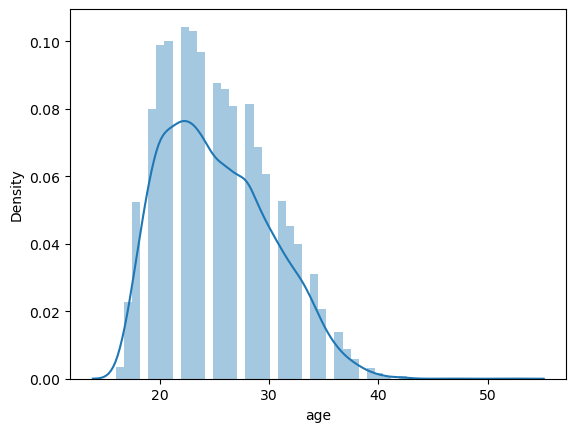

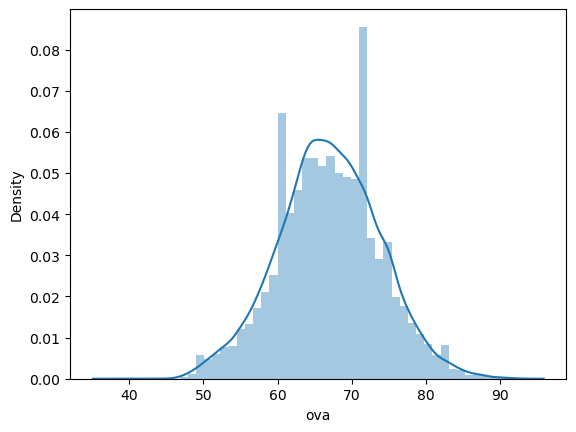

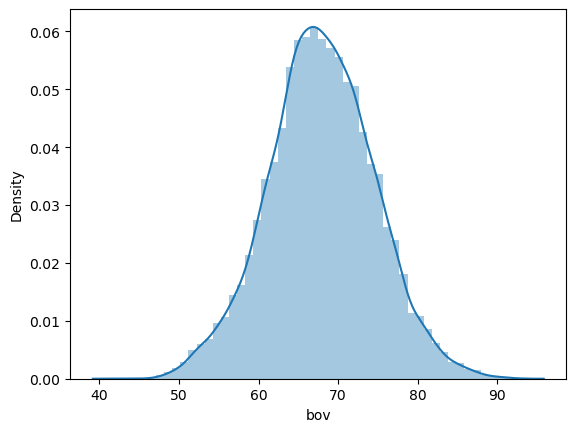

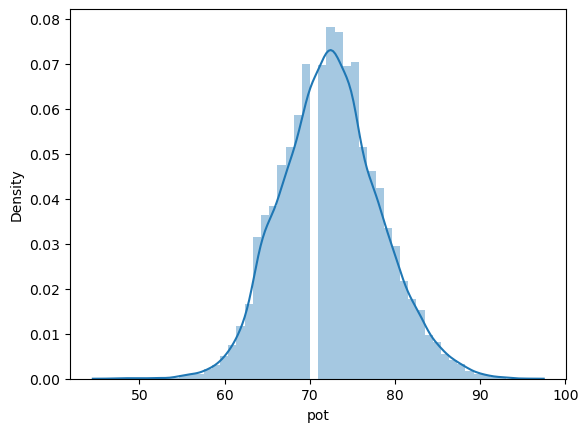

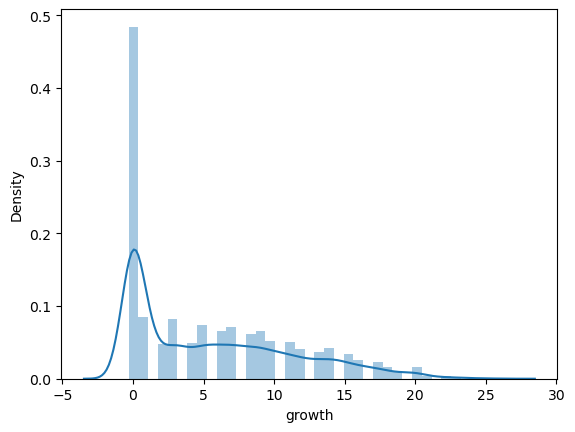

...

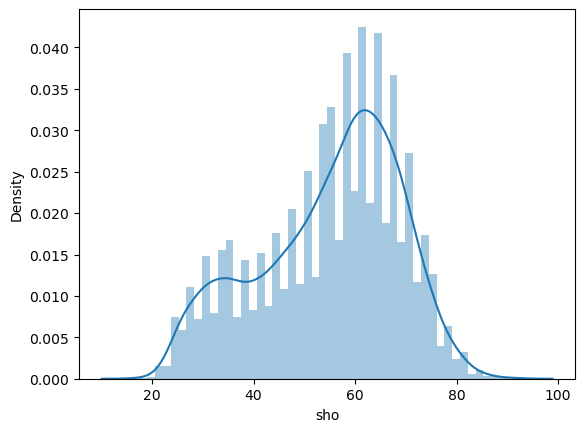

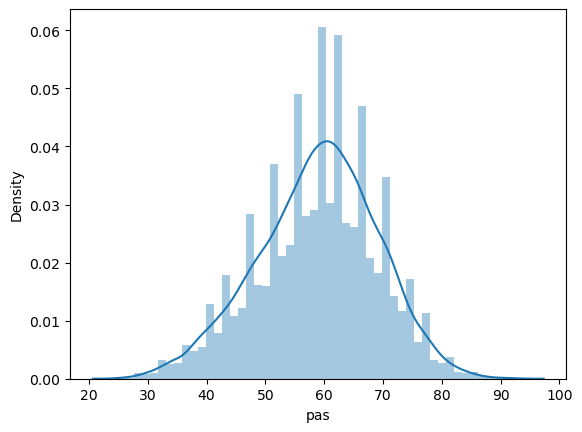

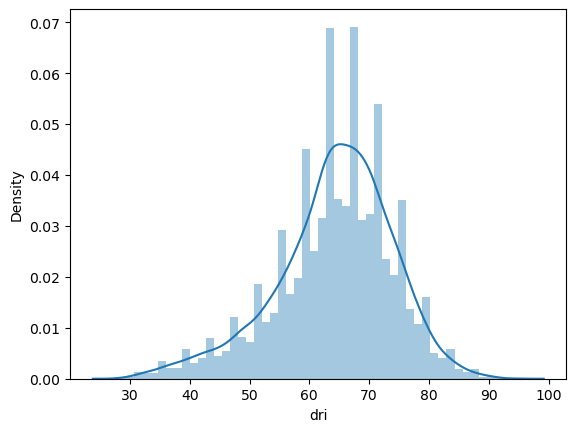

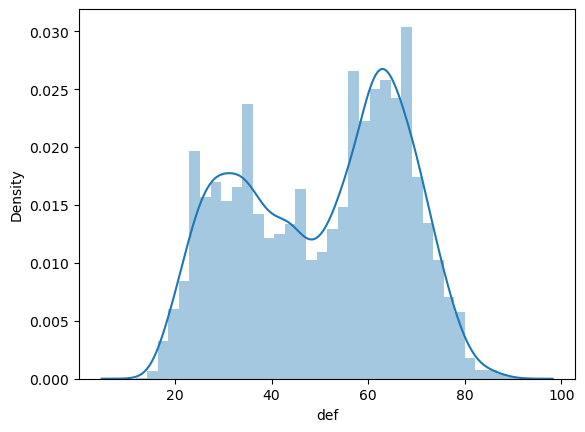

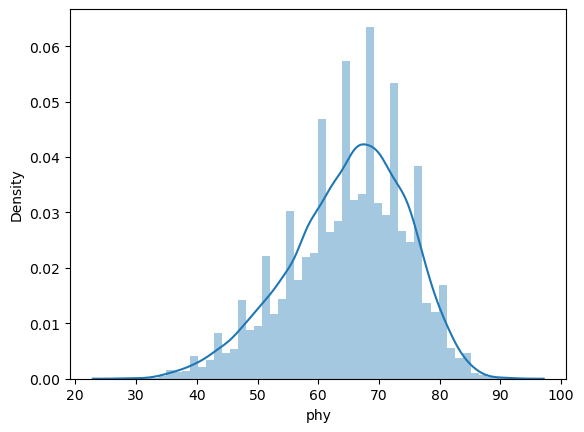

In [47]:
# now it's time for some visualization (the whole data)
for column in num21.columns:
    sns.distplot(num21[column])
    plt.show()

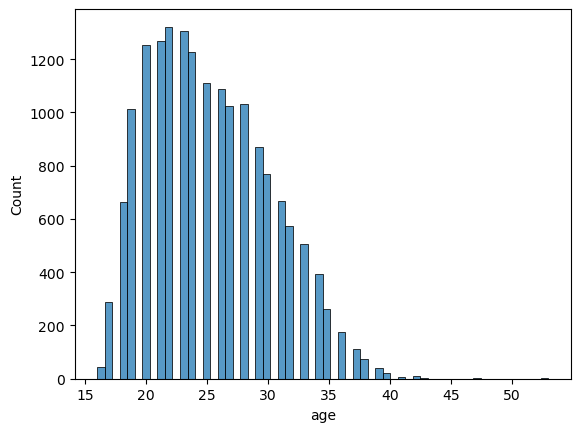

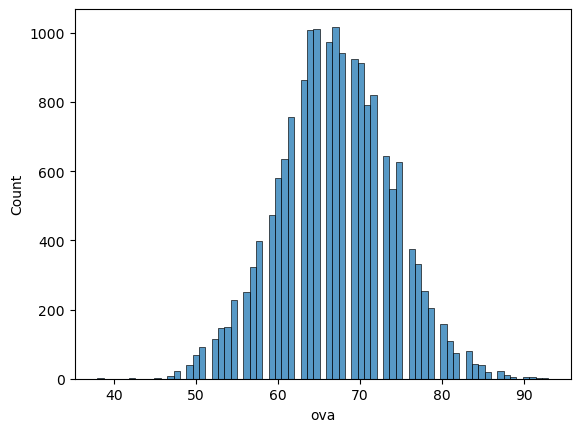

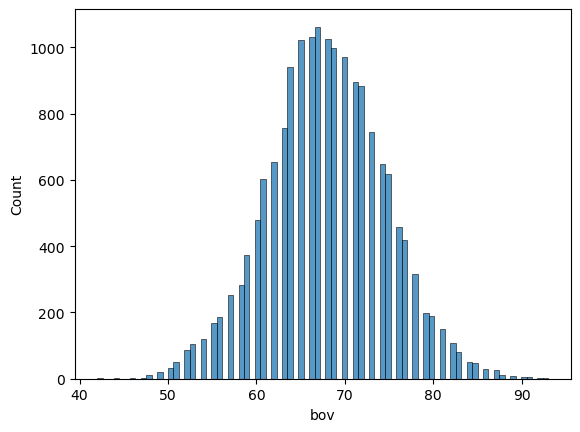

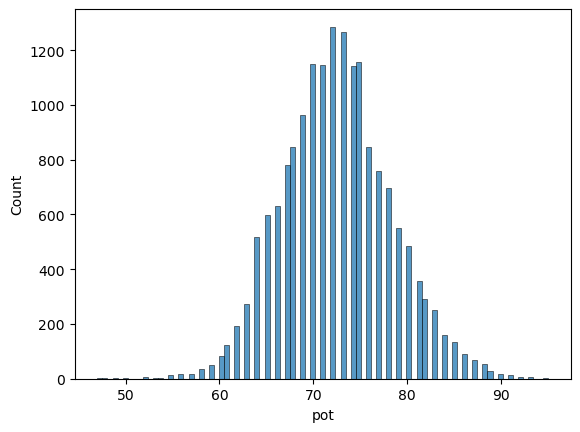

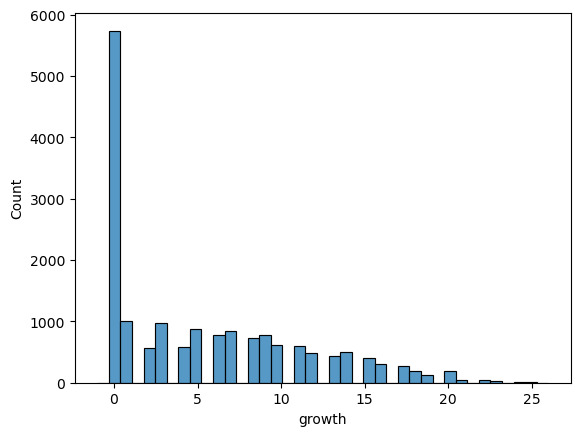

...

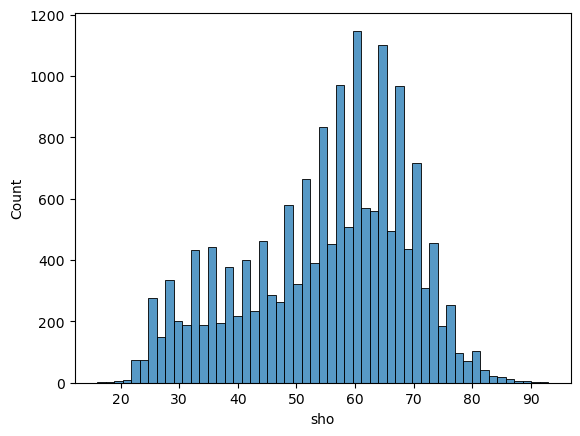

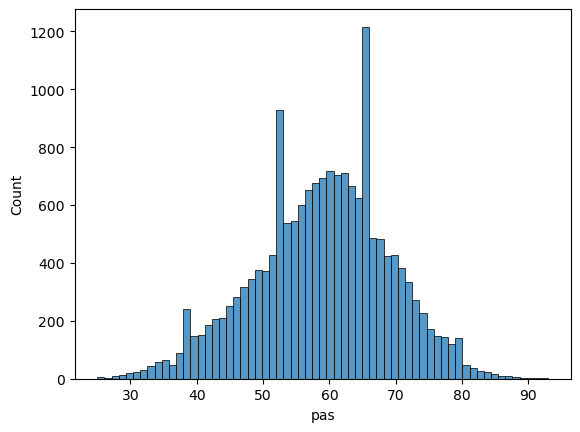

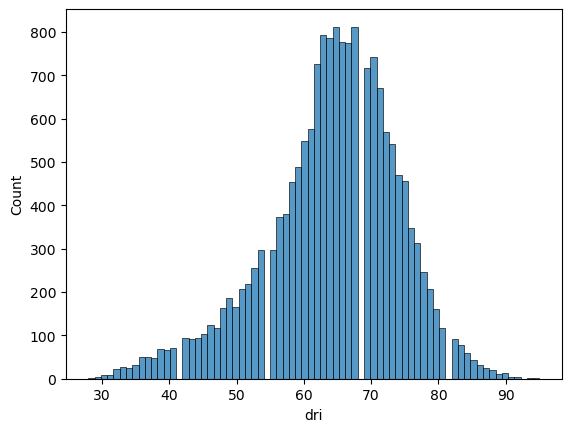

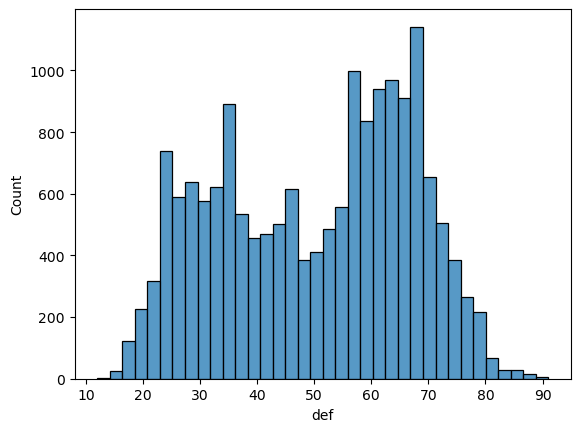

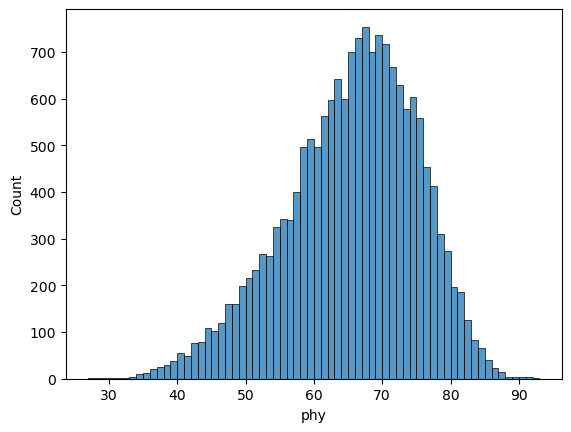

In [48]:
for column in num21.columns:
    sns.histplot(num21[column])
    plt.show()

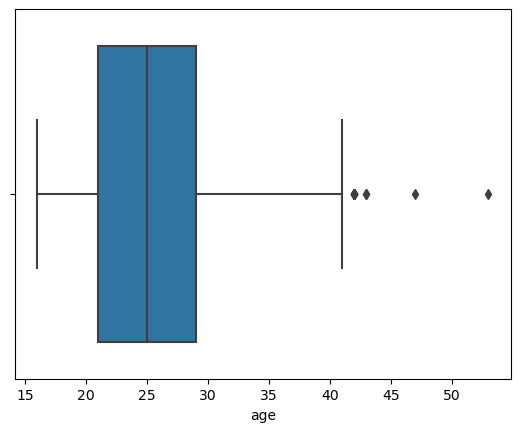

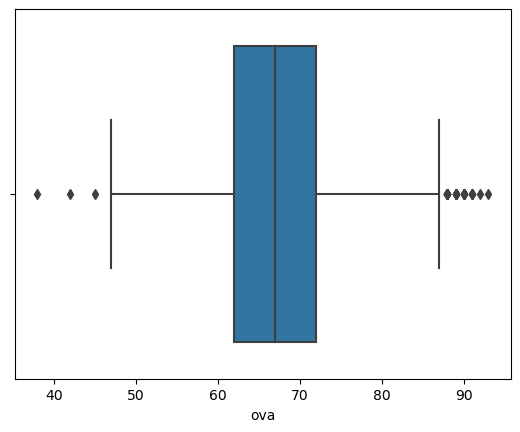

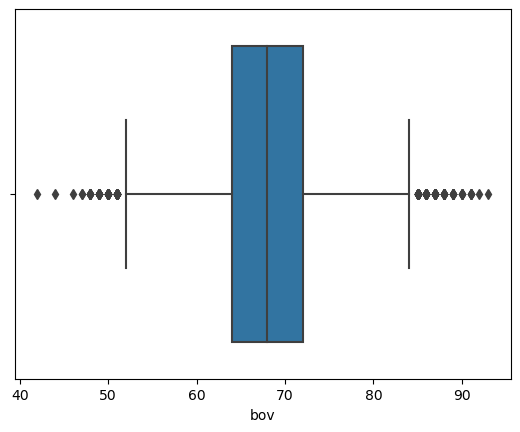

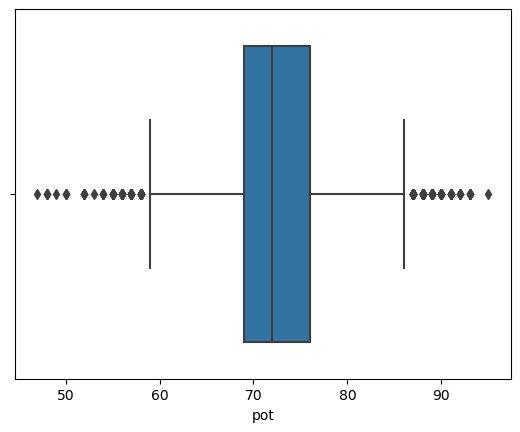

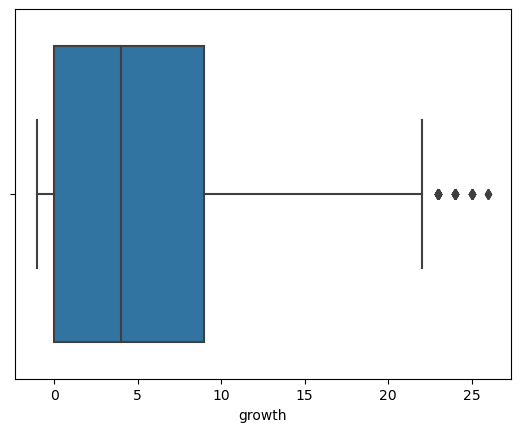

...

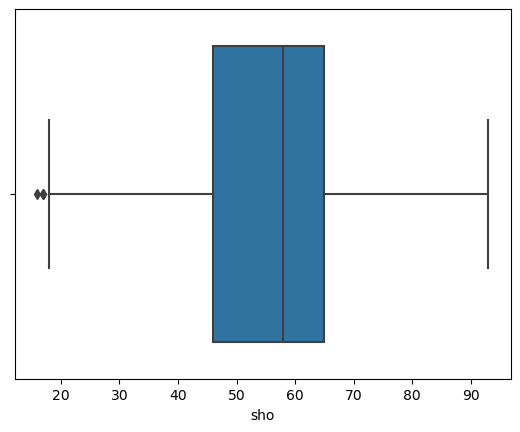

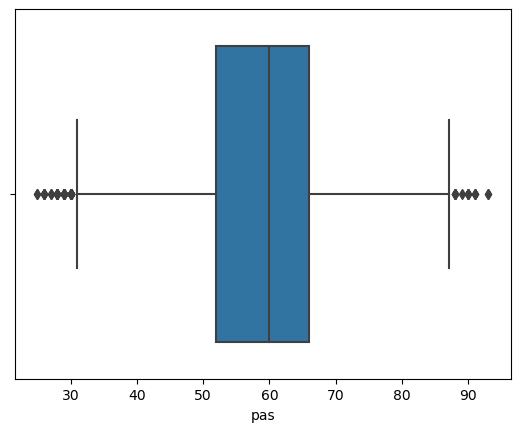

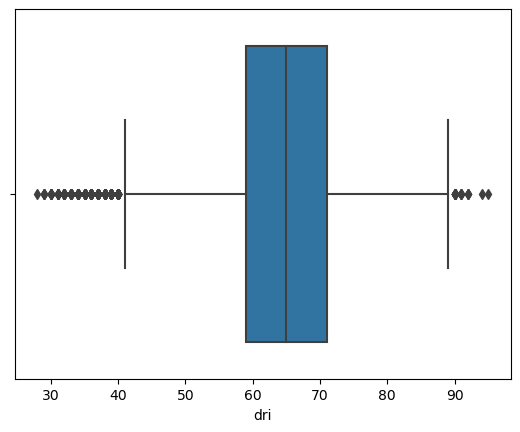

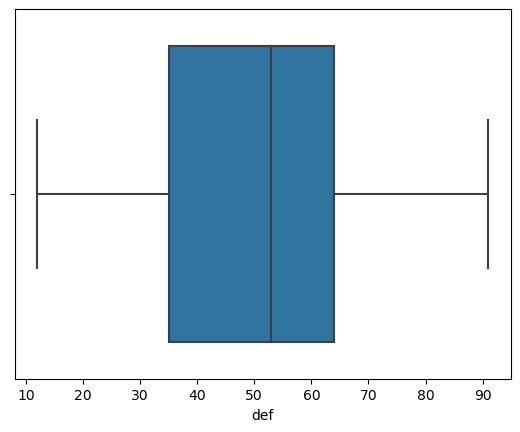

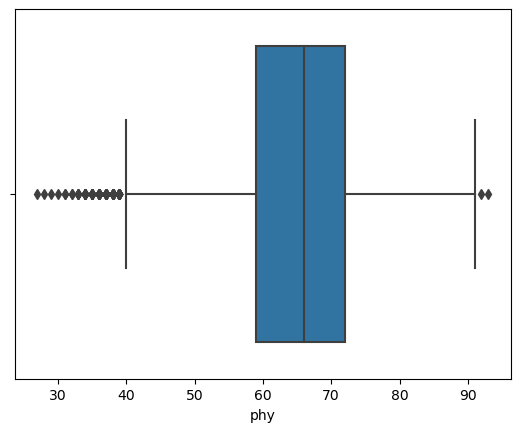

In [49]:
for column in num21.columns:
    sns.boxplot(num21[column])
    plt.show()

In [50]:
# as seen , we have multiple options to have a normal distribution

In [51]:
# check for Multicollinearity (a thing that we don't want)
round(num21.corr(),2)

,age,ova,bov,pot,growth,value,release_clause,attacking,skill,movement,power,mentality,defending,goalkeeping,total_stats,base_stats,pac,sho,pas,dri,def,phy
age,1.00,0.52,0.46,-0.24,-0.85,0.10,0.08,0.18,0.17,-0.06,0.31,0.27,0.11,0.13,0.28,0.41,-0.18,0.31,0.40,0.24,0.22,0.44
ova,0.52,1.00,0.99,0.59,-0.60,0.63,0.60,0.43,0.44,0.30,0.55,0.50,0.25,0.04,0.61,0.83,0.20,0.49,0.70,0.64,0.34,0.54
bov,0.46,0.99,1.00,0.63,-0.54,0.64,0.61,0.46,0.47,0.34,0.57,0.52,0.27,-0.01,0.64,0.83,0.21,0.48,0.69,0.64,0.35,0.54
pot,-0.24,0.59,0.63,1.00,0.29,0.56,0.55,0.23,0.27,0.26,0.22,0.24,0.14,-0.01,0.33,0.47,0.26,0.24,0.40,0.45,0.17,0.16
growth,-0.85,-0.60,-0.54,0.29,1.00,-0.19,-0.16,-0.28,-0.26,-0.10,-0.43,-0.34,-0.16,-0.05,-0.39,-0.51,0.02,-0.33,-0.43,-0.32,-0.24,-0.48
value,0.10,0.63,0.64,0.56,-0.19,1.00,0.98,0.29,0.30,0.26,0.33,0.31,0.13,0.00,0.39,0.53,0.21,0.32,0.44,0.44,0.17,0.27
release_clause,0.08,0.60,0.61,0.55,-0.16,0.98,1.00,0.27,0.28,0.25,0.31,0.29,0.13,0.00,0.37,0.50,0.20,0.30,0.42,0.42,0.17,0.25
attacking,0.18,0.43,0.46,0.23,-0.28,0.29,0.27,1.00,0.93,0.69,0.82,0.89,0.31,-0.77,0.90,0.43,0.18,0.35,0.37,0.38,0.11,0.10
skill,0.17,0.44,0.47,0.27,-0.26,0.30,0.28,0.93,1.00,0.73,0.75,0.88,0.37,-0.71,0.93,0.50,0.22,0.33,0.52,0.49,0.17,0.03
movement,-0.06,0.30,0.34,0.26,-0.10,0.26,0.25,0.69,0.73,1.00,0.56,0.61,0.17,-0.56,0.74,0.45,0.70,0.23,0.31,0.50,0.01,-0.11


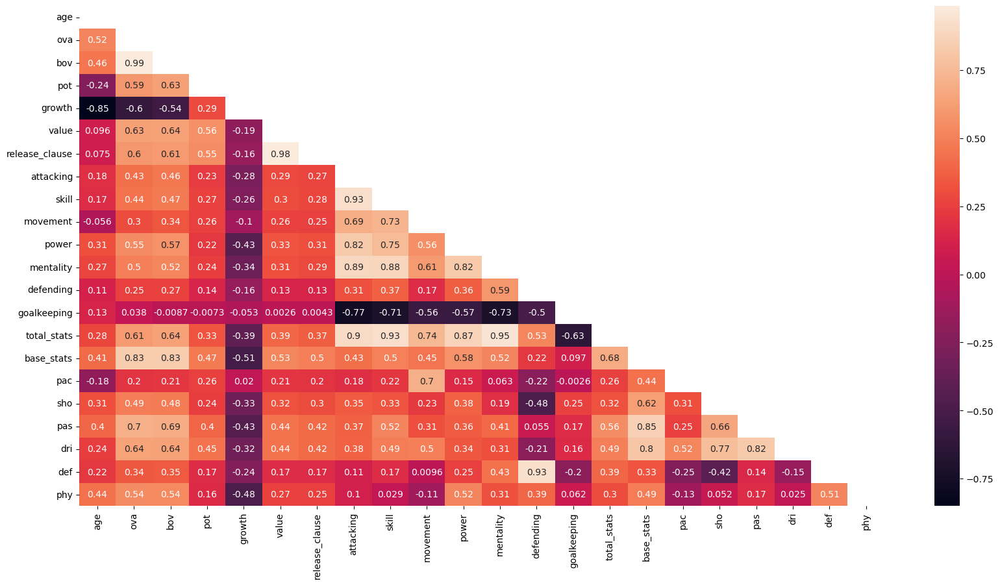

In [52]:
mask = np.zeros_like(num21.corr())
mask[np.triu_indices_from(mask)] = True 
fig, ax = plt.subplots(figsize=(20, 10))
ax = sns.heatmap(num21.corr(), mask=mask, annot=True)
plt.show()

In [53]:
# drop the columns with high collinearity - checking the heatmap, chose to remove this ones
num21 = num21.drop(["ova", "release_clause", "skill" , "total_stats", "defending"], axis = 1)

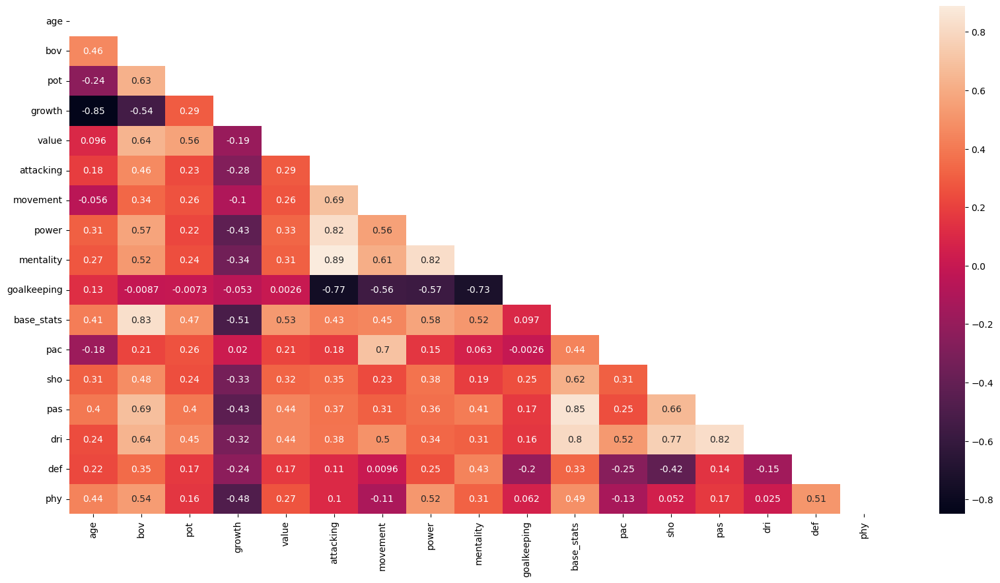

In [54]:
mask = np.zeros_like(num21.corr())
mask[np.triu_indices_from(mask)] = True 
fig, ax = plt.subplots(figsize=(20, 10))
ax = sns.heatmap(num21.corr(), mask=mask, annot=True)
plt.show()

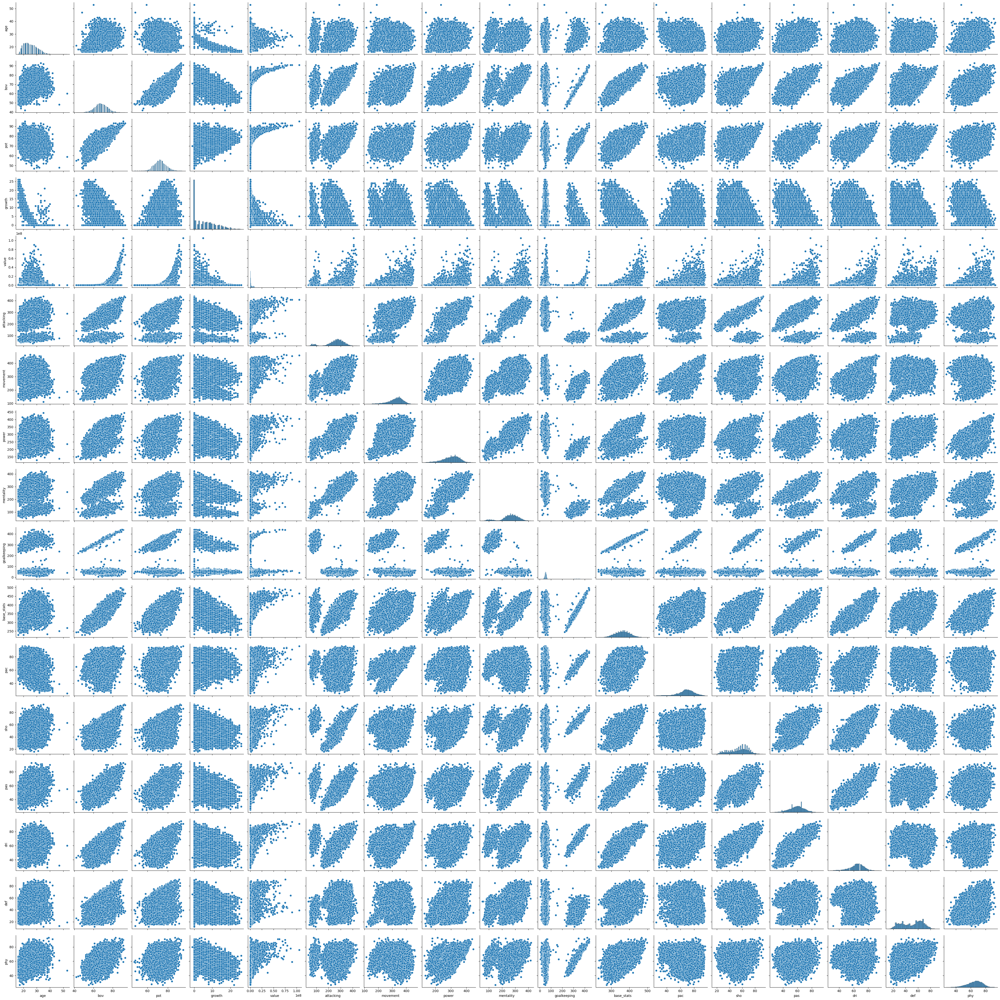

In [55]:
sns.pairplot(num21)

In [56]:
#normalize after x-y split

In [57]:
#X-Y split
Y = num21["bov"]
X = num21.drop(["bov"], axis=1)
X.head()

,age,pot,growth,value,attacking,movement,power,mentality,goalkeeping,base_stats,pac,sho,pas,dri,def,phy
0,33,69,0,625000,313,347,347,320,56,408,71,59,70,71,68,69
1,37,71,0,600000,337,305,324,362,56,385,53,69,73,69,58,63
2,33,71,0,1100000,337,295,284,317,51,354,45,68,76,77,36,52
3,36,82,14,0,264,176,239,271,68,369,61,66,66,69,47,60
4,36,81,0,5500000,367,346,297,370,45,420,58,70,85,85,63,59


In [58]:
X.shape

(17125, 16)

In [59]:
# Let's normalize this

In [60]:
transformer = MinMaxScaler().fit(X) 
x_minmax = transformer.transform(X) 
print(x_minmax.shape)

(17125, 16)


In [61]:
X_num21_norm = pd.DataFrame(x_minmax,columns=X.columns)
X_num21_norm.head() 

,age,pot,growth,value,attacking,movement,power,mentality,goalkeeping,base_stats,pac,sho,pas,dri,def,phy
0,0.459459,0.458333,0.037037,0.005924,0.693069,0.666667,0.693038,0.727763,0.117241,0.666667,0.647887,0.558442,0.661765,0.641791,0.708861,0.636364
1,0.567568,0.500000,0.037037,0.005687,0.752475,0.547009,0.620253,0.840970,0.117241,0.581481,0.394366,0.688312,0.705882,0.611940,0.582278,0.545455
2,0.459459,0.500000,0.037037,0.010427,0.752475,0.518519,0.493671,0.719677,0.105747,0.466667,0.281690,0.675325,0.750000,0.731343,0.303797,0.378788
3,0.540541,0.729167,0.555556,0.000000,0.571782,0.179487,0.351266,0.595687,0.144828,0.522222,0.507042,0.649351,0.602941,0.611940,0.443038,0.500000
4,0.540541,0.708333,0.037037,0.052133,0.826733,0.663818,0.534810,0.862534,0.091954,0.711111,0.464789,0.701299,0.882353,0.850746,0.645570,0.484848


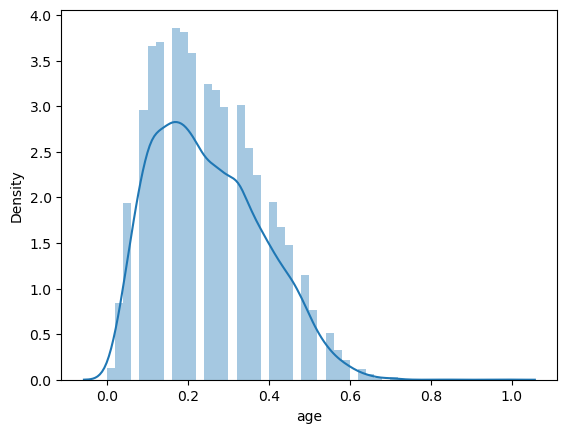

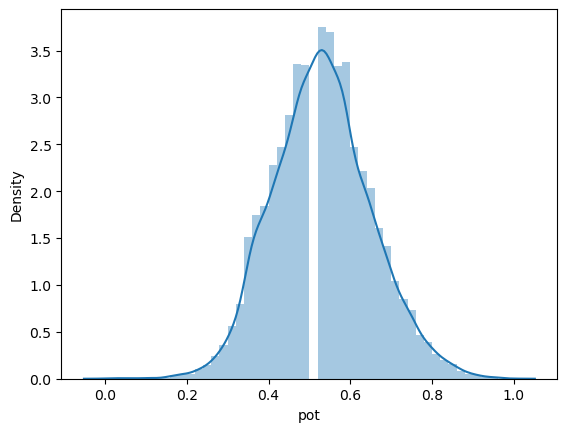

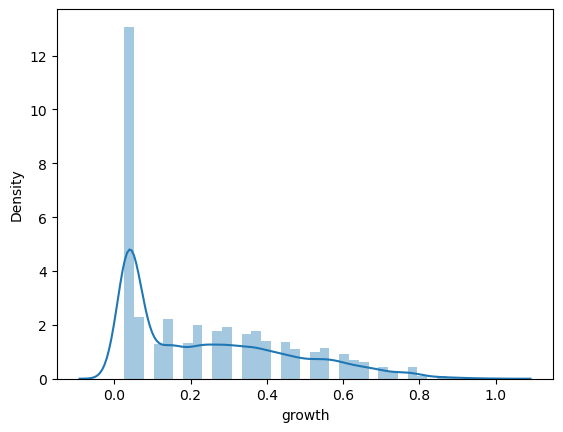

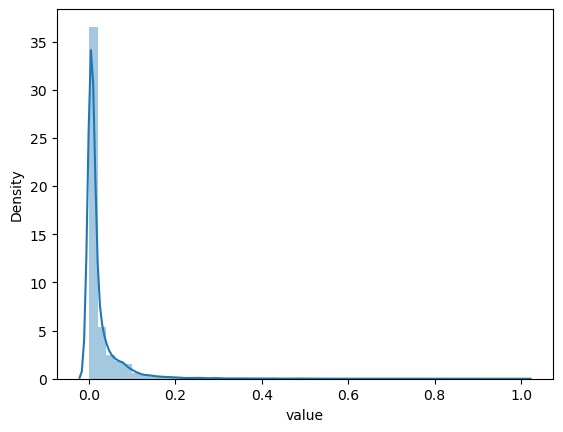

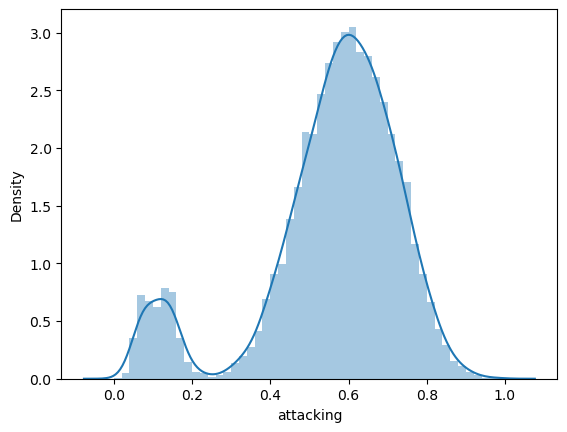

...

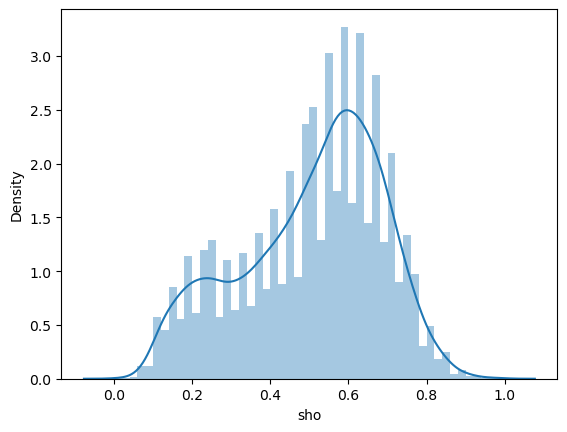

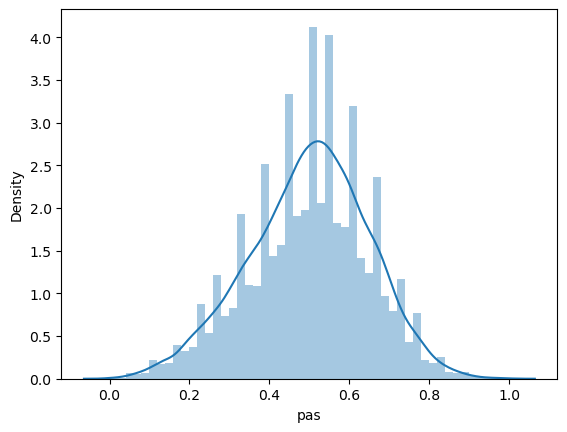

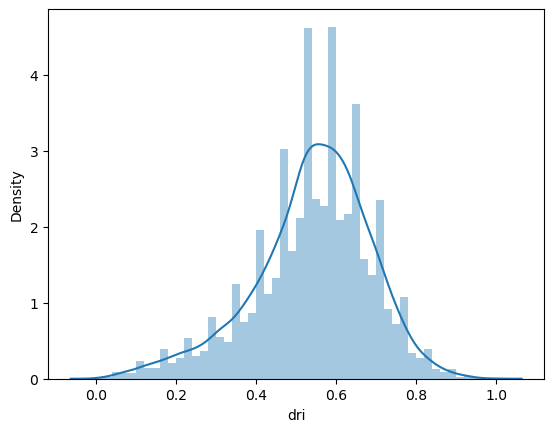

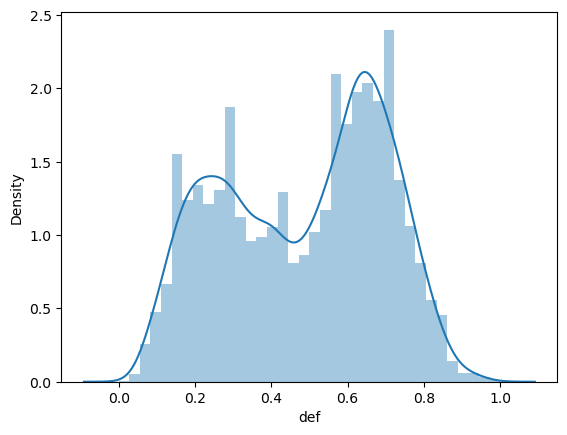

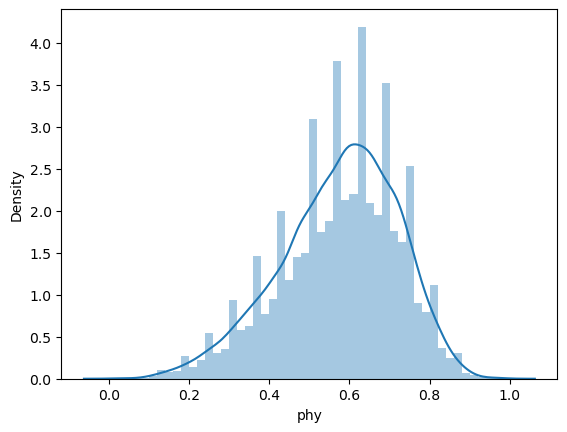

In [62]:
for column in X_num21_norm.columns:
    sns.distplot(X_num21_norm[column])
    plt.show()

In [63]:
# Encoding Categorical Data. 

In [64]:
cat21_dumm = pd.get_dummies(cat21, drop_first = True)
cat21_dumm

,bp_CB,bp_CDM,bp_CF,bp_CM,bp_GK,bp_LB,bp_LM,bp_LW,bp_LWB,bp_RB,bp_RM,bp_RW,bp_RWB,bp_ST
0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17120,1,0,0,0,0,0,0,0,0,0,0,0,0,0
17121,0,0,0,0,0,0,0,0,0,0,0,0,0,0
17122,0,0,0,0,0,0,0,0,0,1,0,0,0,0
17123,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [65]:
cat_num_21 = pd.concat([X_num21_norm, cat21_dumm], axis = 1)
cat_num_21.head(1)

,age,pot,growth,value,attacking,movement,power,mentality,goalkeeping,base_stats,pac,sho,pas,dri,def,phy,bp_CB,bp_CDM,bp_CF,bp_CM,bp_GK,bp_LB,bp_LM,bp_LW,bp_LWB,bp_RB,bp_RM,bp_RW,bp_RWB,bp_ST
0,0.459459,0.458333,0.037037,0.005924,0.693069,0.666667,0.693038,0.727763,0.117241,0.666667,0.647887,0.558442,0.661765,0.641791,0.708861,0.636364,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [66]:
# NOW train test split

In [67]:
cat_num_21_train, cat_num_21_test, Y_train, Y_test = train_test_split(cat_num_21, Y, test_size=0.3, random_state=50)

In [68]:
#Apply model

In [69]:
model = LinearRegression()
model.fit(cat_num_21_train,Y_train)

LinearRegression()

In [70]:
pred = model.predict(cat_num_21_test)
pred.shape

(5138,)

In [71]:
R2 = r2_score(Y_test, pred)
RMSE = mean_squared_error(Y_test, pred, squared=False)
MSE = mean_squared_error(Y_test, pred)
print("r2 = ", R2)
print("RMSE = ", RMSE)
print("MSE = ", MSE)

r2 =  0.9838102492507745
RMSE =  0.8457620585954483
MSE =  0.7153134597596105


In [72]:
adj_r2 = (1 - (1 - R2) * ((cat_num_21.shape[0] - 1) / 
          (cat_num_21.shape[0] - cat_num_21.shape[1] - 1)))
adj_r2

0.9837818362097966

In [73]:
# =======================================================

In [74]:
# will try de boxcox to check if the model can be improved

In [75]:
fifa_box = num21.copy()

def boxcox_transform(num21):
    numeric_cols = fifa_box.select_dtypes(np.number).columns
    _ci = {column: None for column in numeric_cols}
    for column in numeric_cols:
        fifa_box[column] = np.where(fifa_box[column]<=0, np.NAN, fifa_box[column]) 
        fifa_box[column] = fifa_box[column].fillna(fifa_box[column].mean())
        transformed_data, ci = stats.boxcox(fifa_box[column])
        fifa_box[column] = transformed_data
        _ci[column] = [ci] 
    return num21, _ci
num21, _ci = boxcox_transform(fifa_box)
fifa_box.head()

,age,bov,pot,growth,value,attacking,movement,power,mentality,goalkeeping,base_stats,pac,sho,pas,dri,def,phy
0,2.333615,56.738223,13.172802,4.584237,9.129377,56934.043922,712496.156462,89046.968991,68971.821546,1.028941,596.439191,2463.742155,453.868664,283.726599,4182.873266,75.923321,2907.224432
1,2.380795,55.975537,13.376923,4.584237,9.111273,66139.801903,518895.289657,77245.658833,88882.191075,1.028941,560.298652,1375.061893,584.977081,301.077674,3935.403734,64.221941,2411.757129
2,2.333615,56.738223,13.376923,4.584237,9.375507,66139.801903,478077.050523,58781.335699,67648.651696,1.026811,511.846827,992.112263,571.299910,318.724409,4973.603546,38.771068,1626.147109
3,2.369619,55.975537,14.448024,7.071382,9.739965,40306.154688,134343.664473,41107.783595,49004.057770,1.032801,535.252888,1820.130636,544.317993,261.064613,3935.403734,51.439501,2181.787768
4,2.369619,65.084741,14.353973,4.584237,10.031482,78631.537298,707460.394125,64496.470514,92968.831341,1.023647,615.356882,1645.953772,598.777474,373.371302,6141.736449,70.063815,2107.755587


In [76]:
# x-y split
Y1 = fifa_box["bov"]
X1 = fifa_box.drop(["bov"], axis=1)
X1.head()

,age,pot,growth,value,attacking,movement,power,mentality,goalkeeping,base_stats,pac,sho,pas,dri,def,phy
0,2.333615,13.172802,4.584237,9.129377,56934.043922,712496.156462,89046.968991,68971.821546,1.028941,596.439191,2463.742155,453.868664,283.726599,4182.873266,75.923321,2907.224432
1,2.380795,13.376923,4.584237,9.111273,66139.801903,518895.289657,77245.658833,88882.191075,1.028941,560.298652,1375.061893,584.977081,301.077674,3935.403734,64.221941,2411.757129
2,2.333615,13.376923,4.584237,9.375507,66139.801903,478077.050523,58781.335699,67648.651696,1.026811,511.846827,992.112263,571.299910,318.724409,4973.603546,38.771068,1626.147109
3,2.369619,14.448024,7.071382,9.739965,40306.154688,134343.664473,41107.783595,49004.057770,1.032801,535.252888,1820.130636,544.317993,261.064613,3935.403734,51.439501,2181.787768
4,2.369619,14.353973,4.584237,10.031482,78631.537298,707460.394125,64496.470514,92968.831341,1.023647,615.356882,1645.953772,598.777474,373.371302,6141.736449,70.063815,2107.755587


In [77]:
# normalize
transformer = MinMaxScaler().fit(X1) 
x_minmax = transformer.transform(X1) 
print(x_minmax.shape)

(17125, 16)


In [78]:
X1_norm = pd.DataFrame(x_minmax,columns=X1.columns)
X1_norm.head() 

,age,pot,growth,value,attacking,movement,power,mentality,goalkeeping,base_stats,pac,sho,pas,dri,def,phy
0,0.639682,0.505121,0.403197,0.641654,0.505510,0.473265,0.567033,0.563402,0.912351,0.660512,0.514803,0.446671,0.608379,0.500323,0.702740,0.502502
1,0.730628,0.546423,0.403197,0.638329,0.588107,0.335955,0.481001,0.729696,0.912351,0.574614,0.254948,0.593251,0.656822,0.466016,0.574621,0.402282
2,0.639682,0.546423,0.403197,0.686871,0.588107,0.307005,0.346396,0.552350,0.902864,0.459455,0.163542,0.577960,0.706091,0.609942,0.295957,0.243374
3,0.709084,0.763147,0.621949,0.753826,0.356319,0.063215,0.217556,0.396628,0.929547,0.515086,0.361181,0.547794,0.545108,0.466016,0.434665,0.355765
4,0.709084,0.744117,0.403197,0.807381,0.700186,0.469694,0.388059,0.763828,0.888773,0.705476,0.319607,0.608680,0.858662,0.771881,0.638584,0.340791


In [79]:
# concat
cat_X1 = pd.concat([X1_norm, cat21_dumm], axis = 1)
cat_X1.head(1)

,age,pot,growth,value,attacking,movement,power,mentality,goalkeeping,base_stats,pac,sho,pas,dri,def,phy,bp_CB,bp_CDM,bp_CF,bp_CM,bp_GK,bp_LB,bp_LM,bp_LW,bp_LWB,bp_RB,bp_RM,bp_RW,bp_RWB,bp_ST
0,0.639682,0.505121,0.403197,0.641654,0.50551,0.473265,0.567033,0.563402,0.912351,0.660512,0.514803,0.446671,0.608379,0.500323,0.70274,0.502502,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [80]:
# train test
cat_X1_train, cat_X1_test, Y_train, Y_test = train_test_split(cat_X1, Y, test_size=0.3, random_state=50)

In [81]:
model = LinearRegression()
model.fit(cat_X1_train,Y_train)

LinearRegression()

In [82]:
pred2 = model.predict(cat_X1_test)
pred.shape

(5138,)

In [83]:
R2 = r2_score(Y_test, pred2)
RMSE = mean_squared_error(Y_test, pred2, squared=False)
MSE = mean_squared_error(Y_test, pred2)
print("r2 = ", R2)
print("RMSE = ", RMSE)
print("MSE = ", MSE)

r2 =  0.9665411961354275
RMSE =  1.2158593049583613
MSE =  1.4783138494538295


In [84]:
adj_r2 = (1 - (1 - R2) * ((cat_X1.shape[0] - 1) / 
          (cat_X1.shape[0] - cat_X1.shape[1] - 1)))
adj_r2

0.966482475875925

In [85]:
# It gets worse with the BoxCox

In [86]:
fifa21.head()

,id,name,age,ova,nationality,club,bov,bp,pot,growth,value,release_clause,attacking,skill,movement,power,mentality,defending,goalkeeping,total_stats,base_stats,pac,sho,pas,dri,def,phy
0,2,G. Pasquale,33,69,Italy,Udinese,71,LWB,69,0,625000,0,313,338,347,347,320,208,56,1929,408,71,59,70,71,68,69
1,16,Luis García,37,71,Spain,KAS Eupen,70,CM,71,0,600000,1100000,337,369,305,324,362,153,56,1906,385,53,69,73,69,58,63
2,27,J. Cole,33,71,England,Coventry City,71,CAM,71,0,1100000,0,337,387,295,284,317,99,51,1770,354,45,68,76,77,36,52
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,Sunderland,70,ST,82,14,0,0,264,255,176,239,271,75,68,1348,369,61,66,66,69,47,60
4,41,Iniesta,36,81,Spain,Vissel Kobe,82,CAM,81,0,5500000,7200000,367,408,346,297,370,181,45,2014,420,58,70,85,85,63,59


In [87]:
cam_players_y30 = fifa21[(fifa21['bp'] == 'CAM') & (fifa21["age"]<=30)]
cam_players_y30 = cam_players_y30.nlargest(10, 'bov')
cam_players_y30

,id,name,age,ova,nationality,club,bov,bp,pot,growth,value,release_clause,attacking,skill,movement,power,mentality,defending,goalkeeping,total_stats,base_stats,pac,sho,pas,dri,def,phy
2871,192985,K. De Bruyne,29,91,Belgium,Manchester City,91,CAM,91,0,87000000,161000000,407,441,398,408,408,186,56,2304,485,76,86,93,88,64,78
5425,211110,P. Dybala,26,88,Argentina,Juventus,89,CAM,89,1,71000000,122500000,405,436,437,382,348,120,26,2154,452,85,85,84,92,43,63
9633,233049,J. Sancho,20,87,England,Borussia Dortmund,89,CAM,93,6,69500000,132100000,373,380,435,328,313,105,52,1986,430,83,74,81,91,37,64
5633,212198,Bruno Fernandes,25,87,Portugal,Manchester United,88,CAM,90,3,63000000,124400000,396,433,398,411,408,194,63,2303,476,77,83,88,85,68,75
5630,212194,J. Brandt,24,84,Germany,Borussia Dortmund,87,CAM,88,4,40500000,71900000,375,401,412,376,304,160,55,2083,445,81,78,82,87,51,66
10354,235790,K. Havertz,21,85,Germany,Chelsea,87,CAM,93,8,57000000,119700000,400,388,403,378,319,123,47,2058,441,84,81,79,85,45,67
2452,189596,T. Müller,30,86,Germany,FC Bayern München,86,CAM,86,0,42000000,69300000,419,375,374,388,359,150,52,2117,437,68,82,82,78,56,71
4035,202556,M. Depay,26,85,Netherlands,Olympique Lyonnais,86,CAM,88,3,48500000,95800000,386,414,413,408,344,80,50,2095,446,86,83,81,84,32,80
5426,211117,D. Alli,24,83,England,Tottenham Hotspur,86,CAM,87,4,34000000,67200000,393,393,371,390,399,203,41,2190,464,72,80,79,83,71,79
2559,190460,C. Eriksen,28,85,Denmark,Inter,85,CAM,85,0,39000000,64400000,385,428,385,370,341,138,43,2090,438,72,81,88,81,53,63


Text(0.5, 1.0, 'Top 10 CAM Players under 30 by BOV')

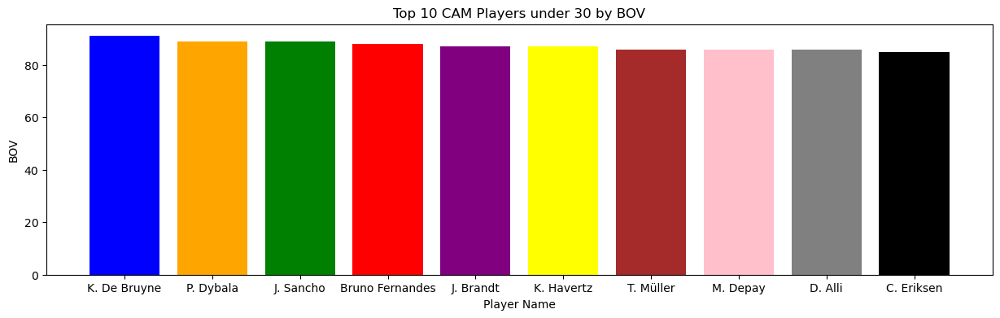

In [88]:
plt.figure(figsize=(15,4))

colors = ['blue', 'orange', 'green', 'red', 'purple', 'yellow', 'brown', 'pink', 'gray', 'black']
plt.bar(cam_players_y30['name'], cam_players_y30['bov'], color=colors)

plt.xlabel('Player Name')
plt.ylabel('BOV')
plt.title('Top 10 CAM Players under 30 by BOV')

Text(0.5, 1.0, 'Top 10 CAM Players under 30 by Price')

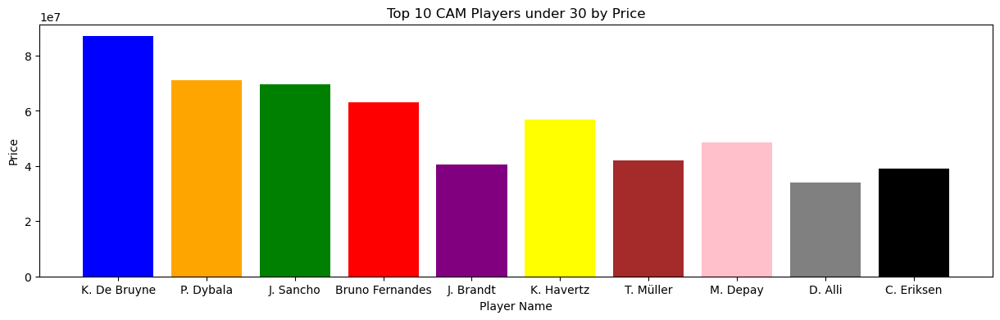

In [89]:
plt.figure(figsize=(15,4))
colors = ['blue', 'orange', 'green', 'red', 'purple', 'yellow', 'brown', 'pink', 'gray', 'black']
plt.bar(cam_players_y30['name'], cam_players_y30['value'], color=colors)

plt.xlabel('Player Name')
plt.ylabel('Price')
plt.title('Top 10 CAM Players under 30 by Price')

Text(0.5, 1.0, 'Top 10 CAM Players under 30 by Age')

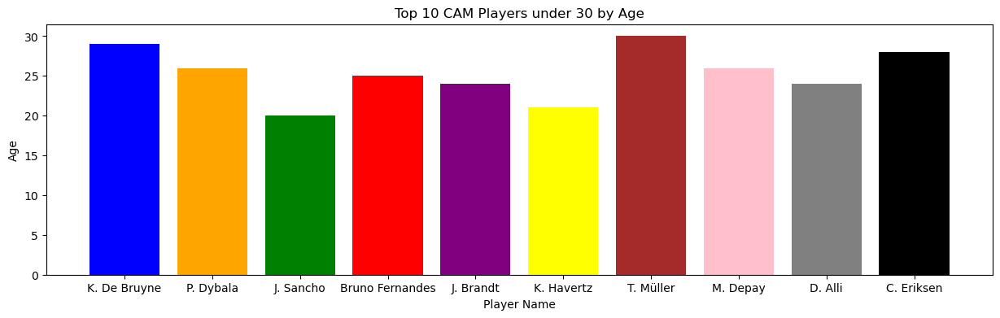

In [90]:
plt.figure(figsize=(15,4))
colors = ['blue', 'orange', 'green', 'red', 'purple', 'yellow', 'brown', 'pink', 'gray', 'black']
plt.bar(cam_players_y30['name'], cam_players_y30['age'], color=colors)

plt.xlabel('Player Name')
plt.ylabel('Age')
plt.title('Top 10 CAM Players under 30 by Age')

Text(0.5, 1.0, 'Top Natiolatitys CAM Players under 30 by BOV')

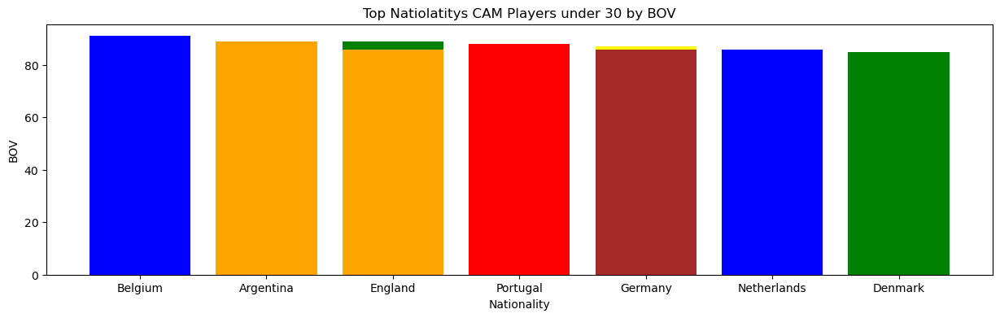

In [91]:
plt.figure(figsize=(15,4))

colors = ['blue', 'orange', 'green', 'red', 'purple', 'yellow', 'brown']
plt.bar(cam_players_y30['nationality'], cam_players_y30['bov'], color=colors)

plt.xlabel('Nationality')
plt.ylabel('BOV')
plt.title('Top Natiolatitys CAM Players under 30 by BOV')

Text(0.5, 1.0, ' Value of CAM Players under 30 by BOV')

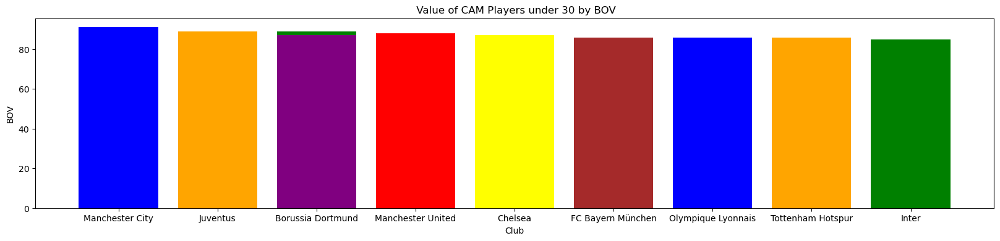

In [92]:
plt.figure(figsize=(20,4))

colors = ['blue', 'orange', 'green', 'red', 'purple', 'yellow', 'brown']
plt.bar(cam_players_y30['club'], cam_players_y30['bov'], color=colors)

plt.xlabel('Club')
plt.ylabel('BOV')
plt.title(" Value of CAM Players under 30 by BOV")

<AxesSubplot:xlabel='age', ylabel='bov'>

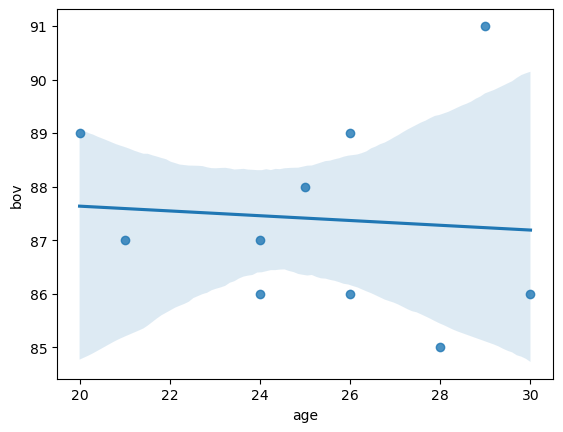

In [93]:
sns.regplot(x=cam_players_y30["age"], y=cam_players_y30["bov"])


Text(0, 0.5, 'Age')

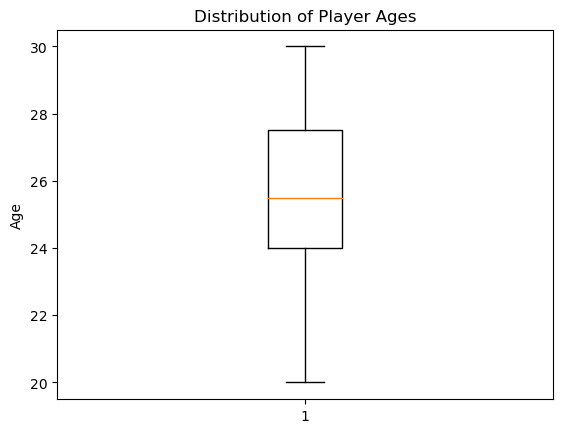

In [94]:
plt.boxplot(cam_players_y30['age'])
plt.title('Distribution of Player Ages')
plt.ylabel('Age')

Text(0, 0.5, 'Value')

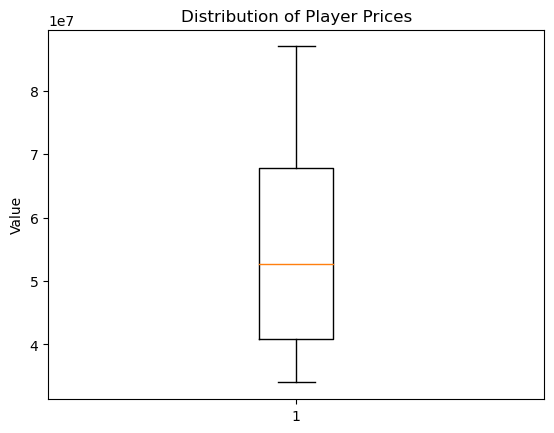

In [95]:
plt.boxplot(cam_players_y30['value'])
plt.title('Distribution of Player Prices')
plt.ylabel('Value')

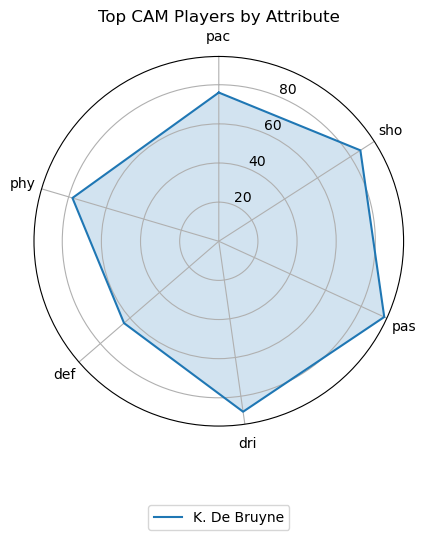

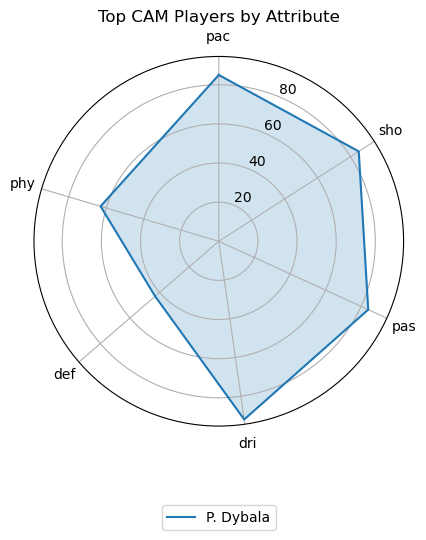

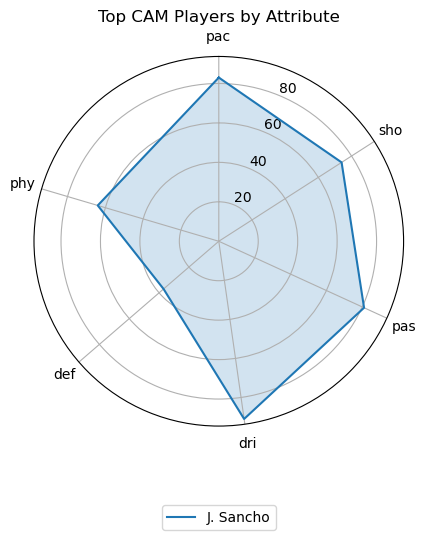

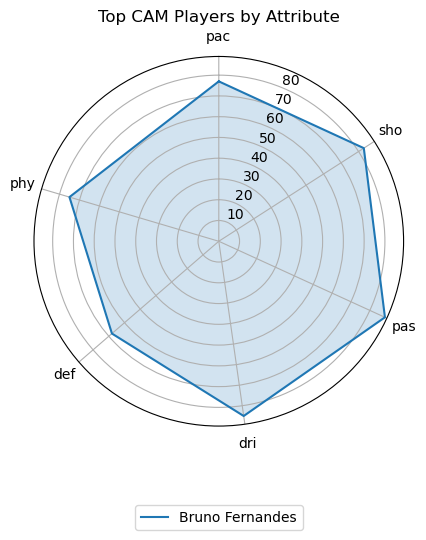

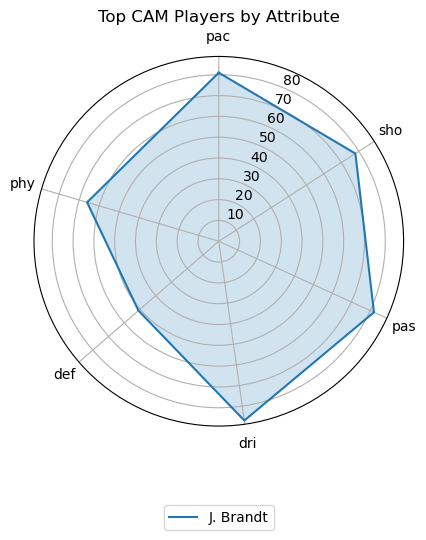

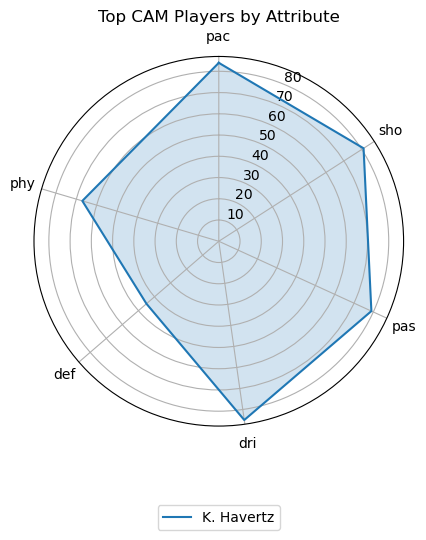

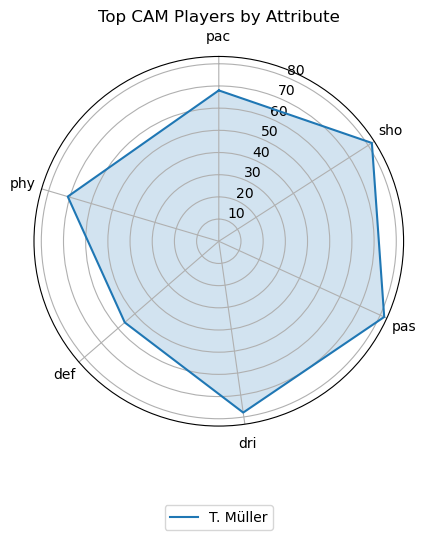

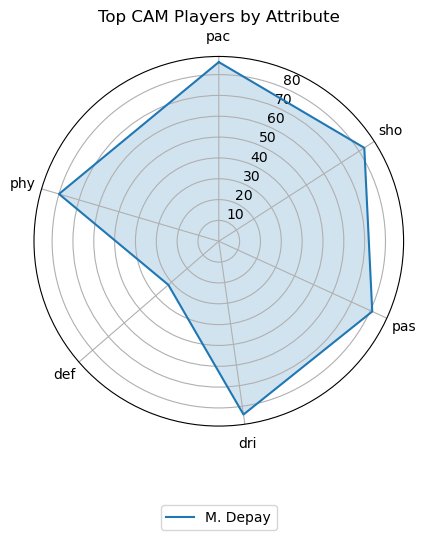

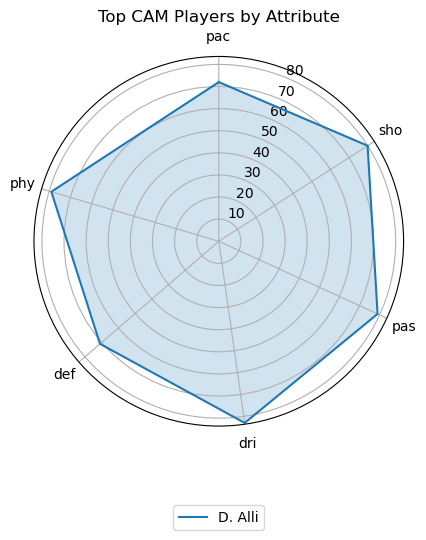

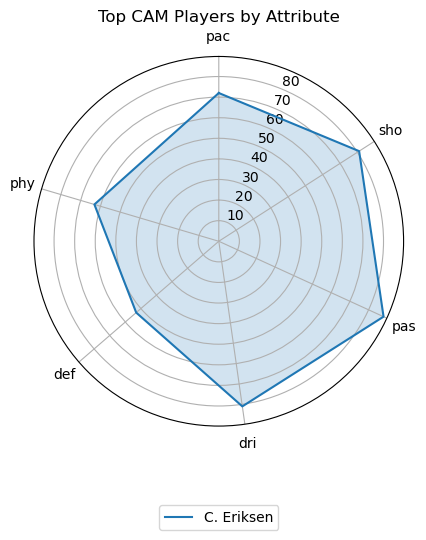

In [100]:
attributes = ["pac", "sho", "pas", "dri", "def", "phy"]

values = []
for i in range(10):
    values.append(list(cam_players_y30[attributes].iloc[i]))

for i in range (10):
    fig, ax = plt.subplots(subplot_kw=dict(polar=True))
    ax.set_theta_offset(0.5 * 3.14159)
    ax.set_theta_direction(-1)

    ax.plot(attributes + [attributes[0]], values[i] + [values[i][0]], label=cam_players_y30['name'].iloc[i])
    ax.fill(attributes + [attributes[0]], values[i] + [values[i][0]], alpha=0.2)


    ax.legend(loc='lower center', bbox_to_anchor=(0.5, -0.3), ncol=5)
    plt.title('Top CAM Players by Attribute')

    ax.legend(loc='lower center', bbox_to_anchor=(0.5, -0.3), ncol=5)
    plt.title('Top CAM Players by Attribute')

    plt.show()